In [ ]:
!pip install river

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.0 MB 7.2 MB/s 


In [ ]:
from river import cluster
from river import stream
from pprint import pprint
from tqdm import tqdm
import pickle
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from pylab import *
%matplotlib inline
import pandas as pd

# Helper Functions

In [ ]:
def trainLoop(total_pts, model, df, pts_per_batch):
    predictions = []
    x_arr = []
    y_arr = []
    c_arr = []
    for i, (xi, _) in tqdm(enumerate(stream.iter_pandas(df[['x-coord','y-coord']][0:total_pts]))):
        # print(i, xi, clustream.centers)
        model = model.learn_one(xi)
        pred = model.predict_one(xi)
        predictions.append(pred)
        # print(f'{i} is assigned to cluster {pred}')
        if i != 0 and i % pts_per_batch == 0:
            tmp_x, tmp_y, tmp_c = [], [], []
            centers = model.centers
            for key in centers.keys():
                tmp_x.append(centers[key]['x-coord'])
                tmp_y.append(centers[key]['y-coord'])
                tmp_c.append(key)
            x_arr.append(tmp_x)
            y_arr.append(tmp_y)
            c_arr.append(tmp_c)

    res = df.copy(deep=True)
    res['predicted labels'] = None
    res['predicted labels'][:total_pts] = predictions
    return res, x_arr, y_arr, c_arr


def plotPREDICTED_returnMETRIC(total_pts, model, pts_per_batch, total_batches, df, dataset_name, algo, saveFig=False, Fix_Label=False):
    global DATA_PATH

    def append_to_MICRO_METRICS(algo, batch_id, name, value, dataset):
        nonlocal MICRO_METRICS
        MICRO_METRICS["algo"].append(algo)
        MICRO_METRICS["batch id"].append(batch_id)
        MICRO_METRICS["name"].append(name)
        MICRO_METRICS["value"].append(value)
        MICRO_METRICS["dataset"].append(dataset)
        return True
    
    # def fix(x, batch_num, df, pts_per_batch):
    #     return df.iloc[(batch_num-1)*pts_per_batch:(batch_num)*pts_per_batch][df['predicted labels'] == x]['label'].value_counts().head(1).index.tolist()[0]
        
    # color
    cmap = cm.get_cmap('tab10')
    colors = []
    for i in range(cmap.N):
        rgba = cmap(i)
        colors.append(matplotlib.colors.rgb2hex(rgba))

    categories = np.unique(range(20))
    colordict = dict(zip(categories, colors))

    res = df.copy(deep=True)
    # PLOTS
    # if Fix_Label == True:
    #     tmp = df.copy(deep=True)
    #     for batch_num in tqdm(range(total_batches)):
    #         batch_num += 1
    #         tmp['predicted labels'].iloc[(batch_num-1)*pts_per_batch:(batch_num)*pts_per_batch] = tmp['predicted labels'].iloc[(batch_num-1)*pts_per_batch:(batch_num)*pts_per_batch].apply(lambda x : fix(x, batch_num, res, pts_per_batch))
    #     res['predicted labels'] = tmp['predicted labels']
   
    plt.figure(figsize=(8, 8))
    plt.scatter(res['x-coord'].iloc[:total_pts], res['y-coord'].iloc[:total_pts], c=res["predicted labels"].iloc[:total_pts].map(lambda x : colordict[x]), edgecolor='white')
    x_arr, y_arr,c_arr = [], [], []
    # TODO: Fix because I onlly get final centers here
    centers = model.centers
    print(centers)
    for key in centers.keys():
        x_arr.append(centers[key]['x-coord'])
        y_arr.append(centers[key]['y-coord'])
        c_arr.append(key)
        # print(x_arr, y_arr, c_arr)
        
    # plt.scatter(x_arr, y_arr, edgecolor='black', color=list(map(lambda x: colordict[x], c_arr)), s=150)
    plt.scatter(x_arr, y_arr, edgecolor='black', c='black', marker='x', s=400)
    plt.title(f"Predicted clusters {algo} - {dataset_name}", color='black')

    if saveFig:
        print(f"saving figure {DATA_PATH + f'/experiments/figures/{dataset_name}_{algo}_predicted'}.png")
        plt.savefig(DATA_PATH+ f"/experiments/figures/{dataset_name}_{algo}_predicted.png")

    
    # PURITY compute
    MICRO_METRICS = { "algo": [],"batch id": [],"name": [],"value": [],"dataset": [] }
    num_clusters = len(res['predicted labels'].unique())
    for batch_id in tqdm(range(total_batches)):
        total_pur = 0
        # print(f"BATCH {batch_id}")
        for c_id in range(num_clusters):
            total = sum(res.iloc[batch_id*pts_per_batch:(batch_id+1)*pts_per_batch][res['predicted labels'] == c_id]['label'].value_counts())
            correct = sum(res.iloc[batch_id*pts_per_batch:(batch_id+1)*pts_per_batch][res['predicted labels'] == c_id]['label'].value_counts().head(1))
            wrong = sum(res.iloc[batch_id*pts_per_batch:(batch_id+1)*pts_per_batch][res['predicted labels'] == c_id]['label'].value_counts().tail(-1))
            purity = correct/total
            # print(f"correct={correct}, wrong={wrong}, total={total} purity ={purity}")
            if purity > 0: total_pur += purity
        
        avg_purity = total_pur/num_clusters
        append_to_MICRO_METRICS(algo='clustream', batch_id=batch_id, name='avg_purity', value=avg_purity, dataset=dataset_name)
        # print(f"average purity = {avg_purity}")
    metrics_dict = pd.DataFrame().from_dict(MICRO_METRICS)
    return metrics_dict


def plot_bar(df, label_name,figsize_x, figsize_y, batch_interval, river_df=False):
    fig, ax = plt.subplots(figsize=(figsize_x, figsize_y))
    df['time step'] = df['batch id'].apply(lambda x: x*batch_interval)
    bar1 = ax.bar(df['time step'], df['value'], align='center', label=f'{label_name}', width=1.5) #, color='b'
    ax.set_title(f"Average {label_name} values", color='black')
    # ax.legend([f"{label_name}"], bbox_to_anchor=(1.0, 1.0))
    ax.set_xticks(df['time step'])
    ax.set_xlabel('Time (sec)')
    ax.set_ylabel(f'Average {label_name}')

    for rect in bar1:
        height = rect.get_height()
        plt.text(rect.get_x() + rect.get_width() / 2.0, height, f'{height:.2f}', ha='center', va='bottom')
    
    if river_df:
        # TODO: create these
        pass

def plotREAL_perBATCH_returnMETRIC(total_pts, model, pts_per_batch, total_batches, df, dataset_name, rows, cols, figsize_x, figsize_y, algo, x_arr, y_arr, c_arr, saveFig=False):
    global DATA_PATH
    fig, ax = plt.subplots(rows, cols, figsize=(figsize_x, figsize_y))

    def append_to_MICRO_METRICS(algo, batch_id, name, value, dataset):
        nonlocal MICRO_METRICS
        MICRO_METRICS["algo"].append(algo)
        MICRO_METRICS["batch id"].append(batch_id)
        MICRO_METRICS["name"].append(name)
        MICRO_METRICS["value"].append(value)
        MICRO_METRICS["dataset"].append(dataset)
        return True
        
    # color
    cmap = cm.get_cmap('tab10')
    colors = []
    for i in range(cmap.N):
        rgba = cmap(i)
        colors.append(matplotlib.colors.rgb2hex(rgba))

    categories = np.unique(range(20))
    colordict = dict(zip(categories, colors))

    res = df.copy(deep=True)
    # PLOTS
    for batch_num in tqdm(range(total_batches)):
        batch_num += 1
        ax = plt.subplot(rows,cols,batch_num)
        ax.scatter(res["x-coord"][0:batch_num*pts_per_batch], res["y-coord"][0:batch_num*pts_per_batch], c=res["label"][0:batch_num*pts_per_batch].map(lambda x : colordict[x]), alpha=0.1, s=20)
        ax.scatter(res["x-coord"][batch_num*pts_per_batch:(batch_num+1)*pts_per_batch], res["y-coord"][batch_num*pts_per_batch:(batch_num+1)*pts_per_batch], c=res["label"][batch_num*pts_per_batch:(batch_num+1)*pts_per_batch].map(lambda x : colordict[x]), edgecolor='black', s=20, alpha=0.7)
        # for the final batch (which was not computed during training)
        tmp_x_arr, tmp_y_arr, tmp_c_arr = [], [], []
        centers = model.centers
        for key in centers.keys():
            tmp_x_arr.append(centers[key]['x-coord'])
            tmp_y_arr.append(centers[key]['y-coord'])
            tmp_c_arr.append(key)
        x_arr.append(tmp_x_arr)
        y_arr.append(tmp_y_arr)
        c_arr.append(tmp_c_arr)
        
        ax.title.set_text(f'Batch {batch_num}')
    
        # plt.scatter(x_arr[batch_num-1], y_arr[batch_num-1], edgecolor='black', color=list(map(lambda x: colordict[x], c_arr[batch_num-1])), s=150)
        plt.scatter(x_arr[batch_num-1], y_arr[batch_num-1], edgecolor='black', c='black', marker='x', s=800)
        # plt.title(f"{algo} - {dataset_name}", color='black')

    if saveFig:
        print(f"saving figure {DATA_PATH + f'/experiments/figures/{dataset_name}_{algo}_perBatchREAL'}.png")
        plt.savefig(DATA_PATH+ f"/experiments/figures/{dataset_name}_{algo}_perBatchREAL.png")

    
    # PURITY compute
    MICRO_METRICS = { "algo": [],"batch id": [],"name": [],"value": [],"dataset": [] }
    num_clusters = len(res['predicted labels'].unique())
    for batch_id in tqdm(range(total_batches)):
        total_pur = 0
        # print(f"BATCH {batch_id}")
        for c_id in range(num_clusters):
            total = sum(res.iloc[batch_id*pts_per_batch:(batch_id+1)*pts_per_batch][res['predicted labels'] == c_id]['label'].value_counts())
            correct = sum(res.iloc[batch_id*pts_per_batch:(batch_id+1)*pts_per_batch][res['predicted labels'] == c_id]['label'].value_counts().head(1))
            wrong = sum(res.iloc[batch_id*pts_per_batch:(batch_id+1)*pts_per_batch][res['predicted labels'] == c_id]['label'].value_counts().tail(-1))
            purity = correct/total
            # print(f"correct={correct}, wrong={wrong}, total={total} purity ={purity}")
            if purity > 0: total_pur += purity
        
        avg_purity = total_pur/num_clusters
        append_to_MICRO_METRICS(algo='clustream', batch_id=batch_id, name='avg_purity', value=avg_purity, dataset=dataset_name)
        # print(f"average purity = {avg_purity}")
    metrics_dict = pd.DataFrame().from_dict(MICRO_METRICS)
    return metrics_dict

def plotPREDICTED_perBATCH_returnMETRIC(total_pts, model, pts_per_batch, total_batches, df, dataset_name, rows, cols, figsize_x, figsize_y, algo, x_arr, y_arr, c_arr, saveFig=False, Fix_Label=False):
    global DATA_PATH
    fig, ax = plt.subplots(rows, cols, figsize=(figsize_x, figsize_y))

    def append_to_MICRO_METRICS(algo, batch_id, name, value, dataset):
        nonlocal MICRO_METRICS
        MICRO_METRICS["algo"].append(algo)
        MICRO_METRICS["batch id"].append(batch_id)
        MICRO_METRICS["name"].append(name)
        MICRO_METRICS["value"].append(value)
        MICRO_METRICS["dataset"].append(dataset)
        return True
    
    # def fix(x, batch_num, df, pts_per_batch):
    #     return df.iloc[(batch_num-1)*pts_per_batch:(batch_num)*pts_per_batch][df['predicted labels'] == x]['label'].value_counts().head(1).index.tolist()[0]
        
    # color
    cmap = cm.get_cmap('tab10')
    colors = []
    for i in range(cmap.N):
        rgba = cmap(i)
        colors.append(matplotlib.colors.rgb2hex(rgba))

    categories = np.unique(range(20))
    colordict = dict(zip(categories, colors))

    res = df.copy(deep=True)
    # FIX predicted labels (NOT WORKNIG CORRECTLY)
    # if Fix_Label == True:
    #     tmp = df.copy(deep=True)
    #     for batch_num in tqdm(range(total_batches)):
    #         batch_num += 1
    #         tmp['predicted labels'].iloc[(batch_num-1)*pts_per_batch:(batch_num)*pts_per_batch] = tmp['predicted labels'].iloc[(batch_num-1)*pts_per_batch:(batch_num)*pts_per_batch].apply(lambda x : fix(x, batch_num, res, pts_per_batch))
    #     res['predicted labels'] = tmp['predicted labels']

    # PLOTS
    for batch_num in tqdm(range(total_batches)):
        batch_num += 1
        # compute last cluster id for the final batch (which was not computed during training)
        if batch_num == total_batches:
            tmp_x_arr, tmp_y_arr, tmp_c_arr = [], [], []
            centers = model.centers
            for key in centers.keys():
                tmp_x_arr.append(centers[key]['x-coord'])
                tmp_y_arr.append(centers[key]['y-coord'])
                tmp_c_arr.append(key)
            x_arr.append(tmp_x_arr)
            y_arr.append(tmp_y_arr)
            c_arr.append(tmp_c_arr)

        ax = plt.subplot(rows,cols,batch_num)
        ax.scatter(res["x-coord"][0:batch_num*pts_per_batch], res["y-coord"][0:batch_num*pts_per_batch], c=res["predicted labels"][0:batch_num*pts_per_batch].map(lambda x : colordict[x]), alpha=0.1, s=20)
        ax.scatter(res["x-coord"][batch_num*pts_per_batch:(batch_num+1)*pts_per_batch], res["y-coord"][batch_num*pts_per_batch:(batch_num+1)*pts_per_batch], c=res["predicted labels"][batch_num*pts_per_batch:(batch_num+1)*pts_per_batch].map(lambda x : colordict[x]), edgecolor='black', s=20, alpha=0.7)

        ax.title.set_text(f'Batch {batch_num}')

        plt.scatter(x_arr[batch_num-1], y_arr[batch_num-1], edgecolor='black', color=list(map(lambda x: colordict[x], c_arr[batch_num-1])), s=1000)
        plt.scatter(x_arr[batch_num-1], y_arr[batch_num-1], edgecolor='black', c='black', marker='x', s=800)
        # plt.title(f"{algo} - {dataset_name}", color='black')

    if saveFig:
        print(f"saving figure {DATA_PATH + f'/experiments/figures/{dataset_name}_{algo}_perBatch_predicted'}.png")
        plt.savefig(DATA_PATH+ f"/experiments/figures/{dataset_name}_{algo}_perBatch_predicted.png")

    
    # PURITY compute
    MICRO_METRICS = { "algo": [],"batch id": [],"name": [],"value": [],"dataset": [] }
    num_clusters = len(res['predicted labels'].unique())
    for batch_id in tqdm(range(total_batches)):
        total_pur = 0
        # print(f"BATCH {batch_id}")
        for c_id in range(num_clusters):
            total = sum(res.iloc[batch_id*pts_per_batch:(batch_id+1)*pts_per_batch][res['predicted labels'] == c_id]['label'].value_counts())
            correct = sum(res.iloc[batch_id*pts_per_batch:(batch_id+1)*pts_per_batch][res['predicted labels'] == c_id]['label'].value_counts().head(1))
            wrong = sum(res.iloc[batch_id*pts_per_batch:(batch_id+1)*pts_per_batch][res['predicted labels'] == c_id]['label'].value_counts().tail(-1))
            purity = correct/total
            # print(f"correct={correct}, wrong={wrong}, total={total} purity ={purity}")
            if purity > 0: total_pur += purity
        
        avg_purity = total_pur/num_clusters
        append_to_MICRO_METRICS(algo='clustream', batch_id=batch_id, name='avg_purity', value=avg_purity, dataset=dataset_name)
        # print(f"average purity = {avg_purity}")
    metrics_dict = pd.DataFrame().from_dict(MICRO_METRICS)
    return metrics_dict
    

# Stream-KMEANS

## datasets:    
 
- aniso (3 labels) - (10k - 20 batches).  
- noisy_moons (2 labels) -  (-//-).  
- blobs (3 labels) -  (-//-).   
- blobs3_noisy (3 labels) - (-//-).  
- blobs5_2d (5 labels) - (-//-).  
- blobs5_3d (5 labels) - (-//-).   (skipping this).  
- noisy_circles (2 labels) -  (-//-).  
- varied (3 labels) -  (-//-).  
- ultimate (8 labels) - (60k pts - 60 batches).  

In [ ]:
DATA_PATH = "/content/drive/MyDrive/shared documents/diplwmatiki-mageirakos/data/datasets/"
database = 'noisy_circles'
dataset_df = pd.read_csv(DATA_PATH+ f'{database}.csv', names=['x-coord','y-coord','label'])
init_dataset_df = pd.read_csv(DATA_PATH+ f'init_{database}.csv', names=['x-coord','y-coord','label'])

pts = 10_000

# -- STREAM KMEANS
modl = cluster.STREAMKMeans(
    # chunk_size=3,
    n_clusters=2,
    # halflife=0.5,
    sigma=1,
    seed=42
    )
res_df, center_x_arr, center_y_arr, center_c_arr  = trainLoop(total_pts = pts, model=modl, df=dataset_df, pts_per_batch=500)
res_df.head()

10000it [00:00, 23002.76it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,x-coord,y-coord,label,predicted labels
0,0.140898,0.964326,1,0
1,1.890815,-0.826475,0,0
2,-1.060151,1.381644,0,0
3,1.799921,-0.586389,0,0
4,1.486522,-0.951342,0,0


100%|██████████| 20/20 [00:00<00:00, 23.63it/s]


saving figure /content/drive/MyDrive/shared documents/diplwmatiki-mageirakos/data/datasets//experiments/figures/noisy_circles_stream-kmeans_perBatch_predicted.png


  0%|          | 0/20 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:269: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:270: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:271: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
100%|██████████| 20/20 [00:00<00:00, 66.98it/s]


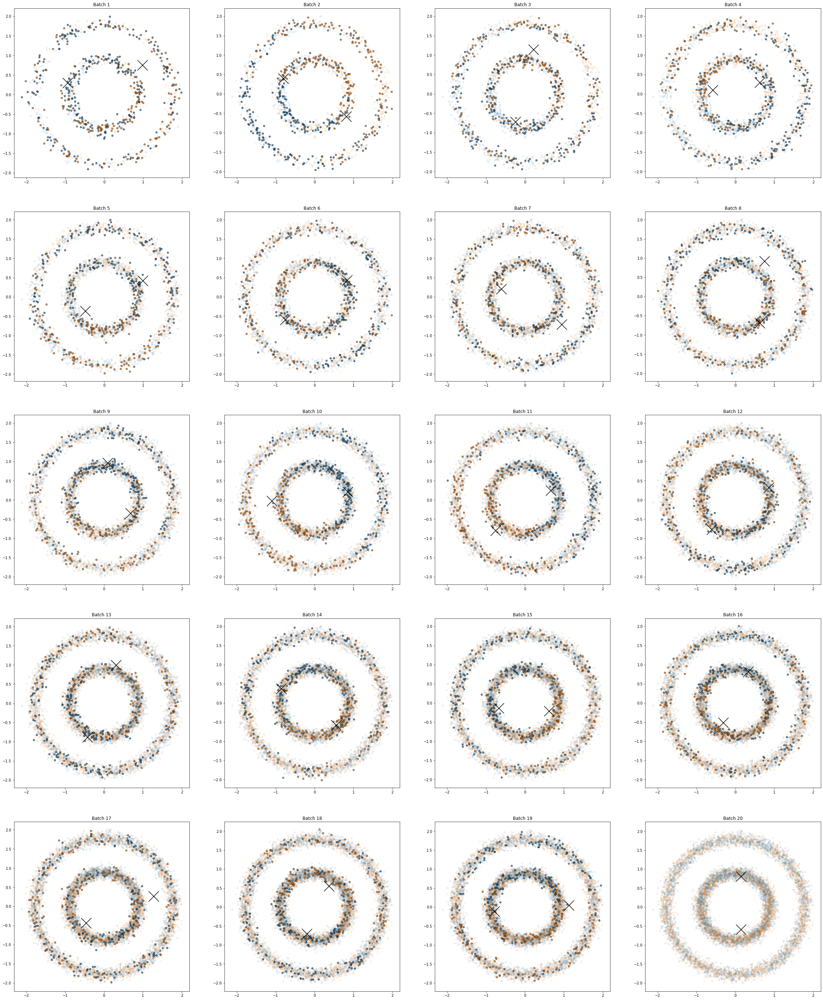

In [ ]:
metrics_df = plotPREDICTED_perBATCH_returnMETRIC(total_pts=10_000, model=modl, pts_per_batch=500, total_batches=20, df=res_df, dataset_name=database, rows=5, cols=4, figsize_x=40, figsize_y=50, algo= 'stream-kmeans', x_arr=center_x_arr, y_arr=center_y_arr, c_arr=center_c_arr, saveFig=True)

100%|██████████| 20/20 [00:01<00:00, 15.66it/s]


saving figure /content/drive/MyDrive/shared documents/diplwmatiki-mageirakos/data/datasets//experiments/figures/noisy_circles_stream-kmeans_perBatchREAL.png


  0%|          | 0/20 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:184: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:186: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
100%|██████████| 20/20 [00:00<00:00, 30.79it/s]


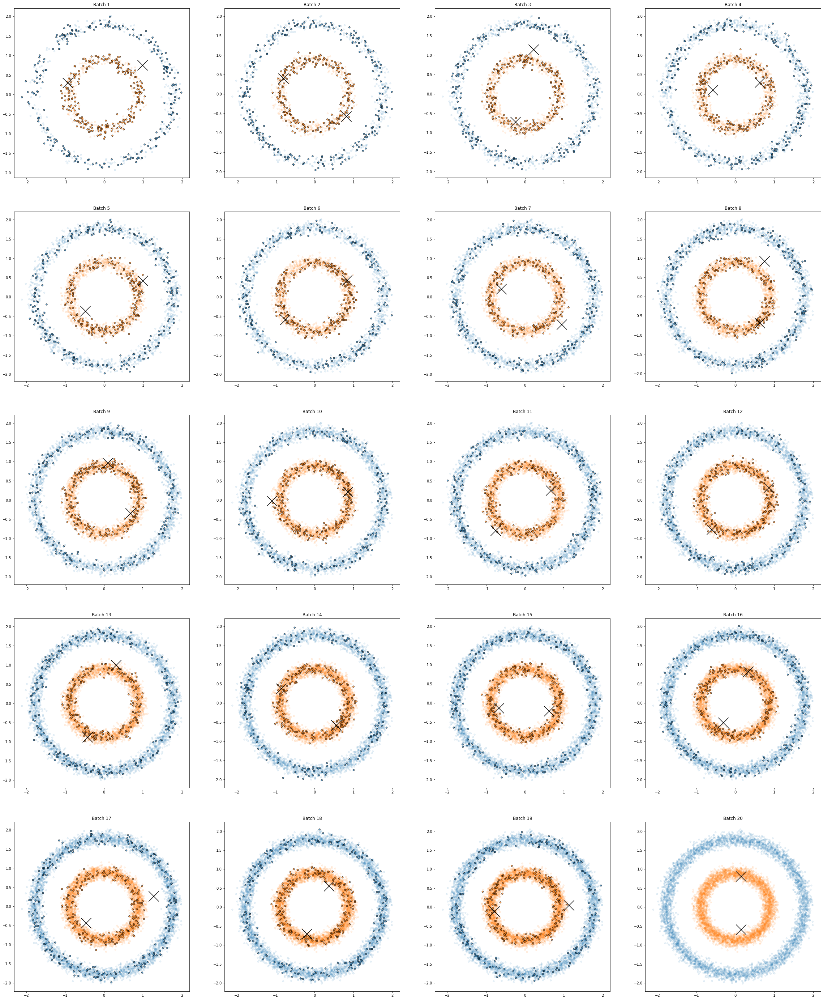

In [ ]:
metrics_df = plotREAL_perBATCH_returnMETRIC(total_pts=10_000, model=modl, pts_per_batch=500, total_batches=20, df=res_df, dataset_name=database, rows=5, cols=4, figsize_x=40, figsize_y=50, algo= 'stream-kmeans', x_arr=center_x_arr, y_arr=center_y_arr, c_arr=center_c_arr, saveFig=True)

{0: defaultdict(..., {'x-coord': 0.1413034319660776, 'y-coord': 0.8083555391318288}), 1: defaultdict(..., {'x-coord': 0.14574706562509654, 'y-coord': -0.594830456220332})}
saving figure /content/drive/MyDrive/shared documents/diplwmatiki-mageirakos/data/datasets//experiments/figures/noisy_circles_stream-kmeans_predicted.png


  0%|          | 0/20 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:93: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:94: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:95: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
100%|██████████| 20/20 [00:00<00:00, 45.72it/s]


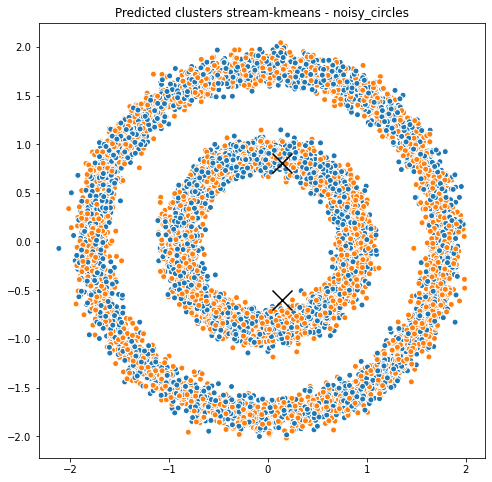

In [ ]:
# based on predicted labels not true labels
metrics_df = plotPREDICTED_returnMETRIC(total_pts=10_000, model=modl, pts_per_batch=500, total_batches=20, df=res_df, dataset_name=database, algo='stream-kmeans', saveFig=True)

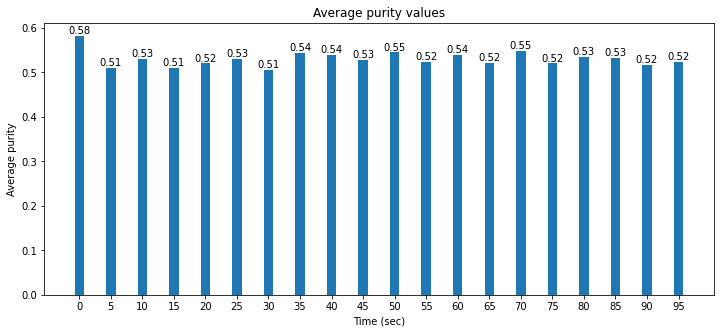

In [ ]:
plot_bar(df=metrics_df, label_name='purity', figsize_x=12, figsize_y=5, batch_interval=5)

In [ ]:
algo = 'stream-kmeans'
metrics_df.to_pickle(DATA_PATH+ f"/experiments/{database}_{algo}_purity.pkl")

# CluStream

## datasets:    
 
- aniso (3 labels) - (10k - 20 batches).  
- noisy_moons (2 labels) -  (-//-).  
- blobs (3 labels) -  (-//-).   
- blobs3_noisy (3 labels) - (-//-).  
- blobs5_2d (5 labels) - (-//-).  
- blobs5_3d (5 labels) - (-//-).   (skipping this).  
- noisy_circles (2 labels) -  (-//-).  
- varied (3 labels) -  (-//-).  
- ultimate (8 labels) - (60k pts - 60 batches).  

In [ ]:
DATA_PATH = "/content/drive/MyDrive/shared documents/diplwmatiki-mageirakos/data/datasets/"
database = 'blobs'
dataset_df = pd.read_csv(DATA_PATH+ f'{database}.csv', names=['x-coord','y-coord','label'])
init_dataset_df = pd.read_csv(DATA_PATH+ f'init_{database}.csv', names=['x-coord','y-coord','label'])

pts = 10_000

# CLUSTREAM (ultima total_batches=60, pts=30_000)
# --- CLUSTREAM
modl = cluster.CluStream(
    time_window=4000, # to simulate l = 0.25 ( after 4 batches we zero tou the effect of the point)
    #   micro_cluster_r_factor=2, # defaults
    # max_micro_clusters=5,
    n_macro_clusters=3,
    seed=42,
    #   halflife=0.01
)
res_df, center_x_arr, center_y_arr, center_c_arr  = trainLoop(total_pts = pts, model=modl, df=dataset_df, pts_per_batch=500)
res_df.head()

10000it [02:17, 72.61it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,x-coord,y-coord,label,predicted labels
0,-0.286375,0.998322,0,0
1,0.977413,-0.248801,1,0
2,-0.065075,1.219900,0,0
3,1.109838,-0.193498,1,0
4,1.426832,0.200773,1,0


100%|██████████| 20/20 [00:00<00:00, 22.03it/s]


saving figure /content/drive/MyDrive/shared documents/diplwmatiki-mageirakos/data/datasets//experiments/figures/blobs_clustream_perBatch_predicted.png


  0%|          | 0/20 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:267: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:268: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:269: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
100%|██████████| 20/20 [00:00<00:00, 42.16it/s]


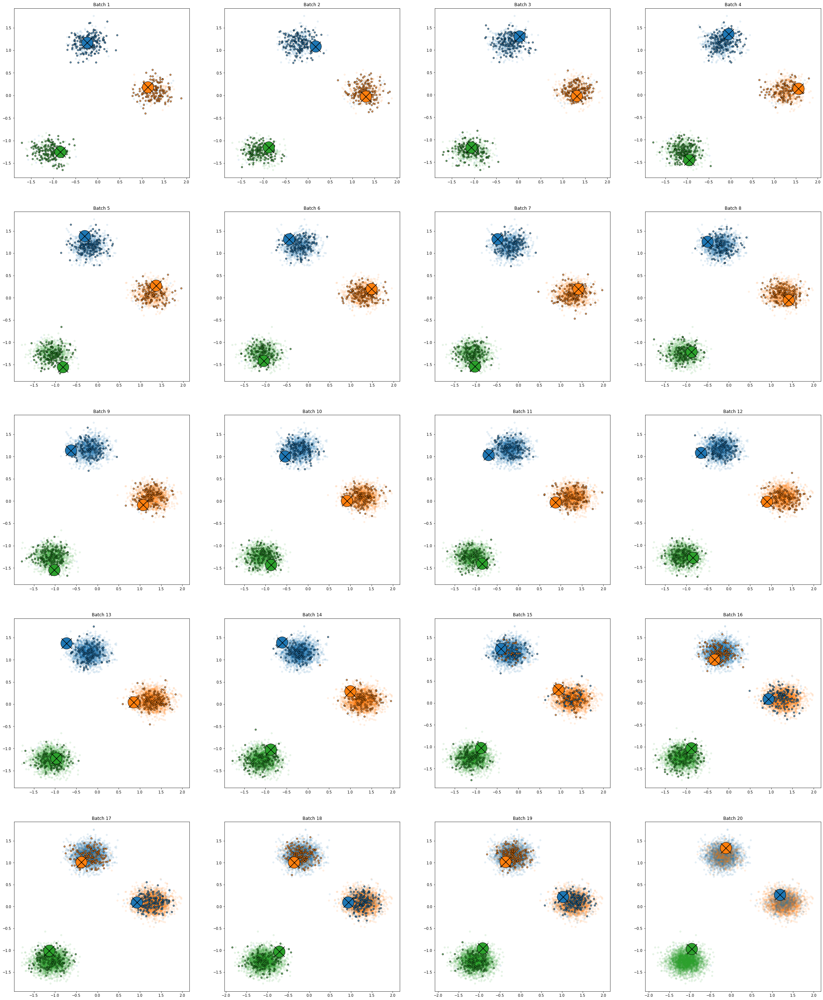

In [ ]:
metrics_df = plotPREDICTED_perBATCH_returnMETRIC(total_pts=10_000, model=modl, pts_per_batch=500, total_batches=20, df=res_df, dataset_name=database, rows=5, cols=4, figsize_x=40, figsize_y=50, algo= 'clustream', x_arr=center_x_arr, y_arr=center_y_arr, c_arr=center_c_arr, saveFig=True)

100%|██████████| 20/20 [00:00<00:00, 21.01it/s]


saving figure /content/drive/MyDrive/shared documents/diplwmatiki-mageirakos/data/datasets//experiments/figures/blobs_clustream_perBatchREAL.png


  0%|          | 0/20 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:182: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:184: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
100%|██████████| 20/20 [00:00<00:00, 44.23it/s]


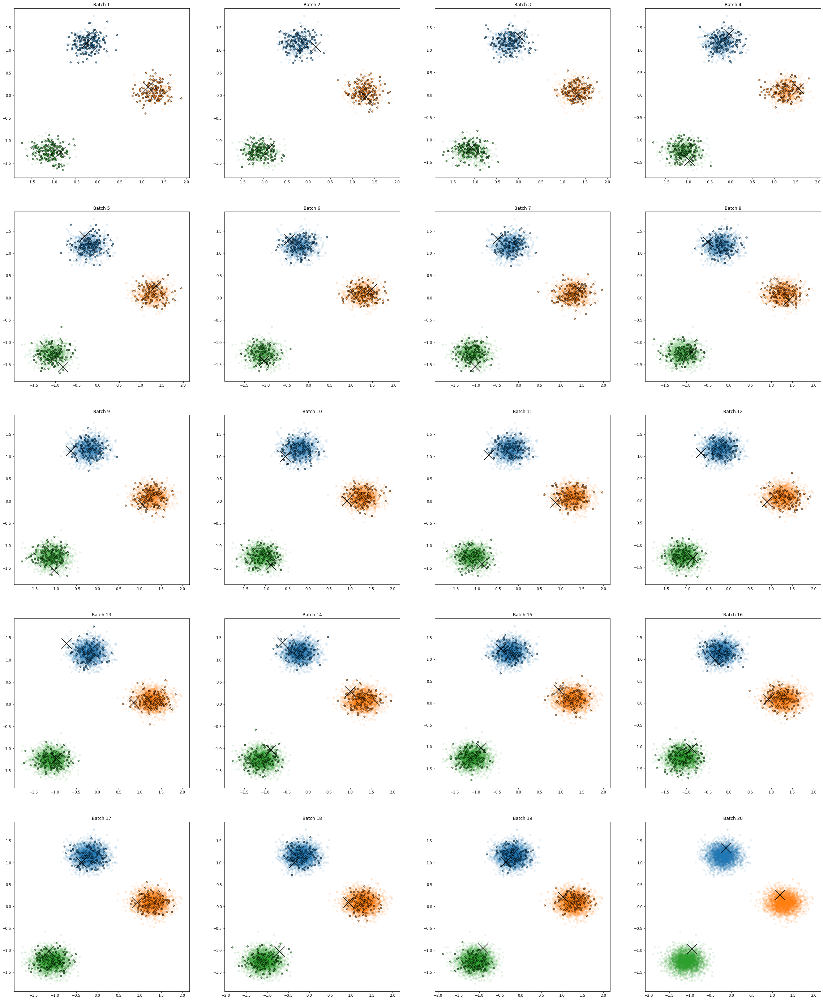

In [ ]:
metrics_df = plotREAL_perBATCH_returnMETRIC(total_pts=10_000, model=modl, pts_per_batch=500, total_batches=20, df=res_df, dataset_name=database, rows=5, cols=4, figsize_x=40, figsize_y=50, algo= 'clustream', x_arr=center_x_arr, y_arr=center_y_arr, c_arr=center_c_arr, saveFig=True)

{0: defaultdict(..., {'x-coord': 1.1862663667020252, 'y-coord': 0.2645120904132753}), 1: defaultdict(..., {'x-coord': -0.12572528571472558, 'y-coord': 1.3350874496663703}), 2: defaultdict(..., {'x-coord': -0.9525972411651713, 'y-coord': -0.9734156570419163})}
saving figure /content/drive/MyDrive/shared documents/diplwmatiki-mageirakos/data/datasets//experiments/figures/blobs_clustream_predicted.png


  0%|          | 0/20 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:91: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:92: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:93: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
100%|██████████| 20/20 [00:00<00:00, 37.71it/s]


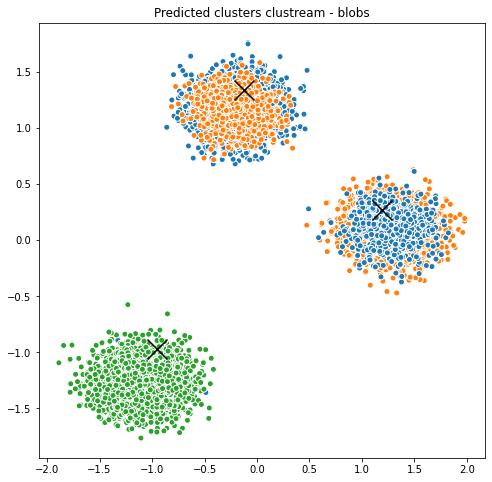

In [ ]:
# based on predicted labels not true labels
metrics_df = plotPREDICTED_returnMETRIC(total_pts=10_000, model=modl, pts_per_batch=500, total_batches=20, df=res_df, dataset_name=database, algo='clustream', saveFig=True)#, Fix_Label=False)

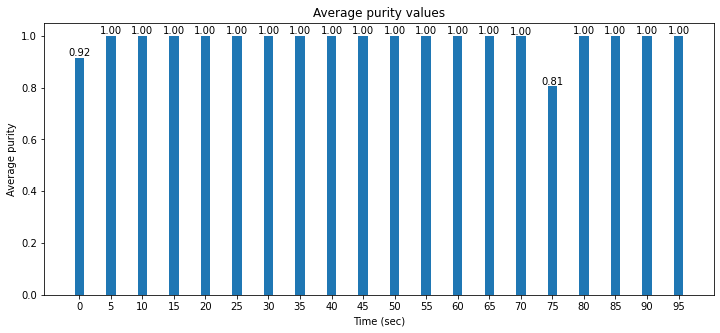

In [ ]:
plot_bar(df=metrics_df, label_name='purity', figsize_x=12, figsize_y=5, batch_interval=5)

In [ ]:
algo = 'clustream'
metrics_df.to_pickle(DATA_PATH+ f"/experiments/{database}_{algo}_purity.pkl")